In [ ]:
!pip install tensorflow
import os
import tensorflow as tf
import numpy as np
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

class CustomDataGenerator(Sequence):
    def __init__(self, image_dir, mask_dir=None, batch_size=32, target_size=(256, 256), shuffle=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle = shuffle
        self.image_filenames = os.listdir(image_dir)

        if mask_dir:
            self.mask_filenames = os.listdir(mask_dir)
            assert len(self.image_filenames) == len(self.mask_filenames), "Number of images and masks must match."
        else:
            self.mask_filenames = None

        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_filenames) / self.batch_size))

    def __getitem__(self, index):
        if index >= len(self):
            raise IndexError('DataGenerator object is out of range')
        batch_images = self.image_filenames[index * self.batch_size:(index + 1) * self.batch_size]
        return self.__data_generation(batch_images)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.image_filenames)

    def __data_generation(self, batch_images):
        X = np.empty((self.batch_size, *self.target_size, 3))  # Satellite images with 3 channels (RGB)
        if self.mask_dir:
            y = np.empty((self.batch_size, *self.target_size, 1))  # Masks converted to 1 channel
        else:
            y = None

        for i, image_name in enumerate(batch_images):
            # Load and preprocess satellite image (RGB)
            img_path = os.path.join(self.image_dir, image_name)
            image = load_img(img_path, target_size=self.target_size)  # Default is RGB
            X[i,] = img_to_array(image) / 255.0  # Normalize to [0, 1]

            # Load and preprocess mask image (convert RGB to grayscale)
            if self.mask_dir:
                mask_name = image_name.replace('_sat.jpg', '_mask.png')
                mask_path = os.path.join(self.mask_dir, mask_name)
                mask = load_img(mask_path, target_size=self.target_size, color_mode='grayscale')  # Load mask as grayscale
                y[i,] = img_to_array(mask) / 255.0

        return X, y

In [ ]:
train_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/train_resize/satellite_resize',
    mask_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/train_resize/mask_resize',
    batch_size=32,
    target_size=(256, 256),
    shuffle=True
)

val_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/validation_resize/validation_satellite_resize',
    mask_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/validation_resize/validation_mask_resize',
    batch_size=32,
    target_size=(256, 256),
    shuffle=False
)

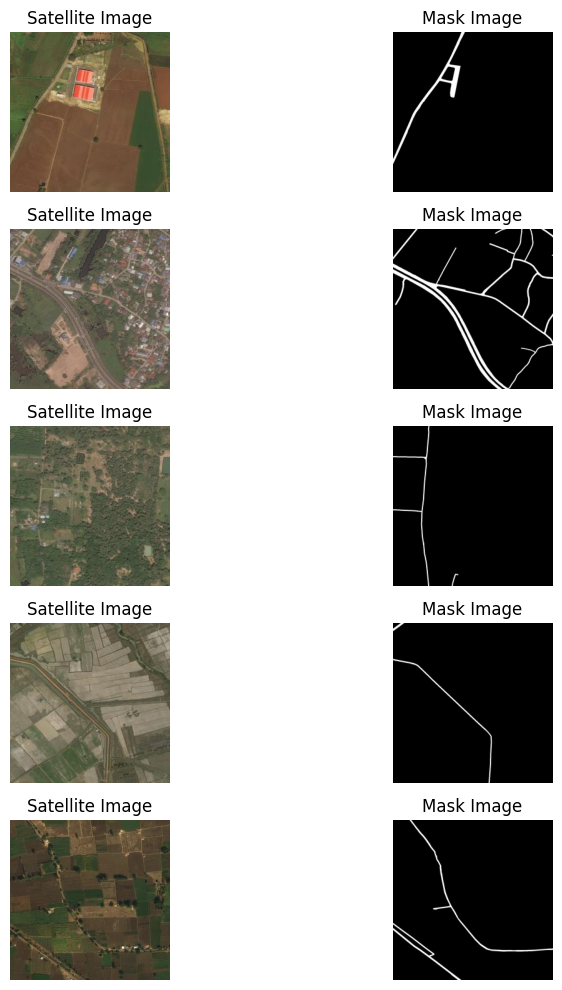

In [ ]:
import matplotlib.pyplot as plt

satellite_images, masks = train_gen[0]  # Get first bactch

num_images = 5

fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 2))

for i in range(num_images):
    # Display satellite image
    axes[i, 0].imshow(satellite_images[i])
    axes[i, 0].set_title('Satellite Image')
    axes[i, 0].axis('off')

    # Display mask image
    axes[i, 1].imshow(masks[i].squeeze(), cmap='gray')  # Squeeze to remove single-dimensional entries
    axes[i, 1].set_title('Mask Image')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
total_batches = len(train_gen)
print(f"Total batches in train_gen: {total_batches}")

Total batches in train_gen: 175


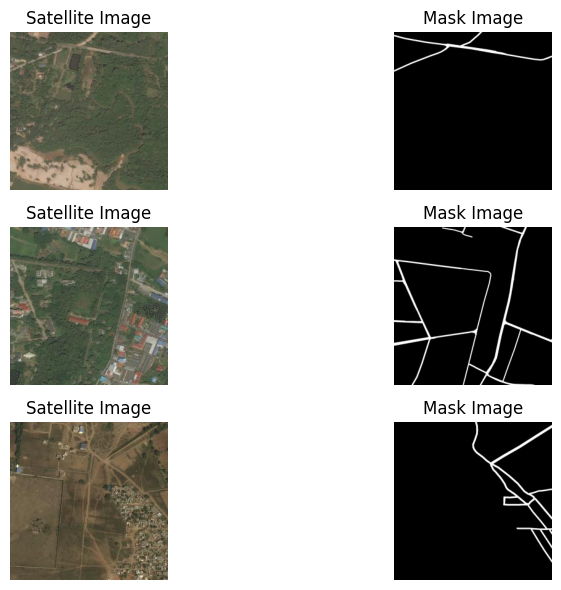

In [ ]:
import matplotlib.pyplot as plt

satellite_images, masks = val_gen[0]  # Get the first batch

num_images = 3

fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 2))

for i in range(num_images):
    axes[i, 0].imshow(satellite_images[i])
    axes[i, 0].set_title('Satellite Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(masks[i].squeeze(), cmap='gray')  # Squeeze to remove single-dimensional entries
    axes[i, 1].set_title('Mask Image')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
total_batches = len(val_gen)
print(f"Total batches in val_gen: {total_batches}")

Total batches in val_gen: 19


In [ ]:
import os
import shutil
import random

def create_test_dataset(source_image_dir, dest_image_dir, num_images=100):
    """
    Creates a test dataset by randomly selecting images from the train dataset.
    Only copies satellite images, excluding masks.

    Args:
        source_image_dir: Path to the source directory containing training images.
        dest_image_dir: Path to the destination directory for test images.
        num_images: Number of images to select for the test dataset.
    """
    # Create destination directory if it doesn't exist
    os.makedirs(dest_image_dir, exist_ok=True)

    # Get a list of image filenames from the source directory
    image_filenames = os.listdir(source_image_dir)

    # Randomly select a subset of images
    selected_images = random.sample(image_filenames, num_images)

    # Copy selected images to the destination directory
    for image_filename in selected_images:
        source_image_path = os.path.join(source_image_dir, image_filename)
        dest_image_path = os.path.join(dest_image_dir, image_filename)
        shutil.copy(source_image_path, dest_image_path)

# Example usage:
source_image_dir = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/train_resize/satellite_resize'
dest_image_dir = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images'

create_test_dataset(source_image_dir, dest_image_dir, num_images=100)

In [ ]:
test_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/updated-data-resized/test_resize/images',  # Specify the 'images' subdirectory
    batch_size=32,  # Or adjust the batch size
    target_size=(256, 256),
    shuffle=False
)

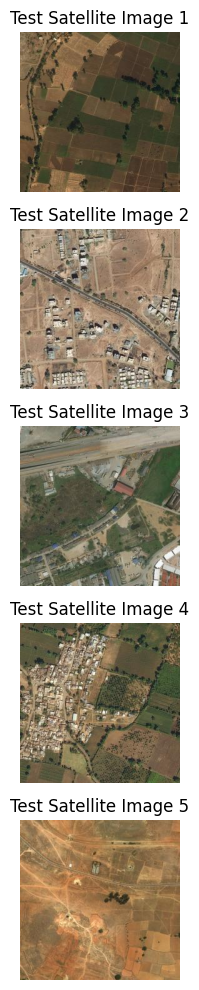

In [ ]:
import matplotlib.pyplot as plt

# Assuming test_gen yields (images, masks), you can access the images like this:
test_images, _ = test_gen[1]  # Ignore masks for visualization

num_images = 5

fig, axes = plt.subplots(num_images, 1, figsize=(10, num_images * 2))

for i in range(num_images):
    # Display satellite image
    axes[i].imshow(test_images[i])  # Access the individual image
    axes[i].set_title(f'Test Satellite Image {i + 1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D

def simple_cnn_model(IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=3):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D((2, 2))(x)  # 128x128x32
    x = Dropout(0.2)(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)  # 64x64x64
    x = Dropout(0.2)(x)

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)  # 32x32x128
    x = Dropout(0.3)(x)

    # Decoder / Upsampling
    x = UpSampling2D((2, 2))(x)  # 64x64x128
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)

    x = UpSampling2D((2, 2))(x)  # 128x128x64
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)

    x = UpSampling2D((2, 2))(x)  # 256x256x32
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)

    # Final segmentation layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [ ]:
model = simple_cnn_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 1)    │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 190,145 (742.75 KB)

 Trainable params: 190,145 (742.75 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

# Paths
model_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras'
log_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/training_log_simple_cnn.csv'

# Callbacks
checkpoint_callback = ModelCheckpoint(
    model_path,
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

#### EarlyStopping avoids overfitting & unnecessary training. ####
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Stop training if val_loss doesn't improve for 5 epochs
    restore_best_weights=True,
    verbose=1
)

#### ReduceLROnPlateau adjusts learning rate dynamically if stuck. ####
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

#### CSVLogger logs all metrics to a CSV file — great for plots. ####
csv_logger = CSVLogger(log_path)

# Train
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,
    verbose=1,
    callbacks=[checkpoint_callback, early_stop, reduce_lr, csv_logger]
)

Epoch 1/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9155 - loss: 0.1433
Epoch 1: val_loss improved from inf to 0.15499, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 515s 10s/step - accuracy: 0.9154 - loss: 0.1434 - val_accuracy: 0.9181 - val_loss: 0.1550 - learning_rate: 0.0010
Epoch 2/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9161 - loss: 0.1384
Epoch 2: val_loss improved from 0.15499 to 0.13604, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 509s 10s/step - accuracy: 0.9161 - loss: 0.1384 - val_accuracy: 0.9181 - val_loss: 0.1360 - learning_rate: 0.0010
Epoch 3/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9140 - loss: 0.1389
Epoch 3: val_loss improved from 0.13604 to 0.13282, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 4: val_loss did not improve from 0.13282
50/50 ━━━━━━━━━━━━━━━━━━━━ 265s 5s/step - accuracy: 0.9096 - loss: 0.1464 - val_accuracy: 0.9181 - val_loss: 0.1418 - learning_rate: 0.0010
Epoch 5/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9159 - loss: 0.1364
Epoch 5: val_loss improved from 0.13282 to 0.12597, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 510s 10s/step - accuracy: 0.9159 - loss: 0.1364 - val_accuracy: 0.9181 - val_loss: 0.1260 - learning_rate: 0.0010
Epoch 6/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9145 - loss: 0.1377
Epoch 6: val_loss did not improve from 0.12597
50/50 ━━━━━━━━━━━━━━━━━━━━ 509s 10s/step - accuracy: 0.9145 - loss: 0.1377 - val_accuracy: 0.9181 - val_loss: 0.1371 - learning_rate: 0.0010
Epoch 7/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9168 - loss: 0.1313
Epoch 7: val_loss improved from 0.12597 to 0.12484, saving model to /con

In [ ]:
from keras.models import load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

# Paths
model_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras'
log_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/training_log_simple_cnn.csv'

# Load the saved model
model = load_model(model_path)

# Callbacks
checkpoint_callback = ModelCheckpoint(
    model_path,
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

#### EarlyStopping avoids overfitting & unnecessary training. ####
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Stop training if val_loss doesn't improve for 5 epochs
    restore_best_weights=True,
    verbose=1
)

#### ReduceLROnPlateau adjusts learning rate dynamically if stuck. ####
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

#### CSVLogger logs all metrics to a CSV file — great for plots. ####
csv_logger = CSVLogger(log_path, append=True)  # Make sure to append to the existing log file

# Resume training from the 10th epoch (as you completed 9 epochs already)
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,  # Adjust the number of epochs if necessary
    initial_epoch=9,  # Start from the 10th epoch (index 9)
    verbose=1,
    callbacks=[checkpoint_callback, early_stop, reduce_lr, csv_logger]
)

Epoch 10/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9158 - loss: 0.1278
Epoch 10: val_loss improved from inf to 0.11934, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 631s 12s/step - accuracy: 0.9158 - loss: 0.1278 - val_accuracy: 0.9182 - val_loss: 0.1193 - learning_rate: 0.0010
Epoch 11/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9117 - loss: 0.1327
Epoch 11: val_loss improved from 0.11934 to 0.11694, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 502s 10s/step - accuracy: 0.9117 - loss: 0.1327 - val_accuracy: 0.9185 - val_loss: 0.1169 - learning_rate: 0.0010
Epoch 12/25
49/50 ━━━━━━━━━━━━━━━━━━━━ 9s 10s/step - accuracy: 0.9168 - loss: 0.1250 

In [ ]:
from keras.models import load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

# Paths
model_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras'
log_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/training_log_simple_cnn.csv'

# Load the saved model
model = load_model(model_path)

# Callbacks
checkpoint_callback = ModelCheckpoint(
    model_path,
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

#### EarlyStopping avoids overfitting & unnecessary training. ####
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Stop training if val_loss doesn't improve for 5 epochs
    restore_best_weights=True,
    verbose=1
)

#### ReduceLROnPlateau adjusts learning rate dynamically if stuck. ####
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

#### CSVLogger logs all metrics to a CSV file — great for plots. ####
csv_logger = CSVLogger(log_path, append=True)  # Make sure to append to the existing log file

# Resume training from the 10th epoch (as you completed 9 epochs already)
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,  # Adjust the number of epochs if necessary
    initial_epoch=11,  # Start from the 10th epoch (index 9)
    verbose=1,
    callbacks=[checkpoint_callback, early_stop, reduce_lr, csv_logger]
)

Epoch 12/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9141 - loss: 0.1270 
Epoch 12: val_loss improved from inf to 0.11690, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 647s 13s/step - accuracy: 0.9141 - loss: 0.1270 - val_accuracy: 0.9184 - val_loss: 0.1169 - learning_rate: 0.0010
Epoch 13/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9146 - loss: 0.1244 
Epoch 13: val_loss improved from 0.11690 to 0.11461, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 684s 14s/step - accuracy: 0.9145 - loss: 0.1245 - val_accuracy: 0.9186 - val_loss: 0.1146 - learning_rate: 0.0010
Epoch 14/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9167 - loss: 0.1226 
Epoch 14: val_loss did not improve from 0.11461
50/50 ━━━━━━━━━━━━━━━━━━━━ 682s 14s/step - accuracy: 0.9166 - loss: 0.1227 - val_accuracy: 0.918

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 15: val_loss improved from 0.11461 to 0.11280, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 380s 7s/step - accuracy: 0.9085 - loss: 0.1310 - val_accuracy: 0.9187 - val_loss: 0.1128 - learning_rate: 0.0010
Epoch 16/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9140 - loss: 0.1236 
Epoch 16: val_loss did not improve from 0.11280
50/50 ━━━━━━━━━━━━━━━━━━━━ 622s 12s/step - accuracy: 0.9141 - loss: 0.1236 - val_accuracy: 0.9187 - val_loss: 0.1130 - learning_rate: 0.0010
Epoch 17/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9107 - loss: 0.1270 
Epoch 17: val_loss improved from 0.11280 to 0.11137, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 622s 12s/step - accuracy: 0.9107 - loss: 0.1270 - val_accuracy: 0.9188 - val_loss: 0.1114 - learning_rate: 0.0010
Epoch 18/25
50/50 ━━━━━━━━━━━━━━━━━━━

In [ ]:
from keras.models import load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

# Paths
model_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras'
log_path = '/content/drive/MyDrive/road-extraction-DL/updated-data-resized/training_log_simple_cnn.csv'

# Load the saved model
model = load_model(model_path)

# Callbacks
checkpoint_callback = ModelCheckpoint(
    model_path,
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

#### EarlyStopping avoids overfitting & unnecessary training. ####
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Stop training if val_loss doesn't improve for 5 epochs
    restore_best_weights=True,
    verbose=1
)

#### ReduceLROnPlateau adjusts learning rate dynamically if stuck. ####
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

#### CSVLogger logs all metrics to a CSV file — great for plots. ####
csv_logger = CSVLogger(log_path, append=True)  # Make sure to append to the existing log file

# Resume training from the 10th epoch (as you completed 9 epochs already)
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,  # Adjust the number of epochs if necessary
    initial_epoch=23,  # Start from the 10th epoch (index 9)
    verbose=1,
    callbacks=[checkpoint_callback, early_stop, reduce_lr, csv_logger]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 24/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.9167 - loss: 0.1144 
Epoch 24: val_loss improved from inf to 0.11642, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 827s 16s/step - accuracy: 0.9167 - loss: 0.1144 - val_accuracy: 0.9147 - val_loss: 0.1164 - learning_rate: 0.0010
Epoch 25/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.9154 - loss: 0.1197 
Epoch 25: val_loss improved from 0.11642 to 0.11302, saving model to /content/drive/MyDrive/road-extraction-DL/updated-data-resized/best_simple_cnn_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 684s 14s/step - accuracy: 0.9153 - loss: 0.1197 - val_accuracy: 0.9152 - val_loss: 0.1130 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 25.


In [ ]:
model.save('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/CNN-25(full).keras')

In [ ]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/CNN(full).keras')

In [ ]:
#### FOR TEST GEN ONLY ####
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

class CustomDataGenerator(Sequence):
    def __init__(self, image_dir, mask_dir=None, batch_size=32, target_size=(256, 256), shuffle=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle = shuffle
        self.image_filenames = os.listdir(image_dir)

        if mask_dir:
            self.mask_filenames = os.listdir(mask_dir)
            assert len(self.image_filenames) == len(self.mask_filenames), "Number of images and masks must match."
        else:
            self.mask_filenames = None

        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_filenames) / self.batch_size))

    def __getitem__(self, index):
        if index >= len(self):
            raise IndexError('DataGenerator object is out of range')
        batch_images = self.image_filenames[index * self.batch_size:(index + 1) * self.batch_size]
        return self.__data_generation(batch_images)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.image_filenames)

    def __data_generation(self, batch_images):
        X = np.empty((self.batch_size, *self.target_size, 3))  # Satellite images with 3 channels (RGB)

        # Initialize y even if mask_dir is None
        y = np.empty((self.batch_size, *self.target_size, 1))

        for i, image_name in enumerate(batch_images):
            # Load and preprocess satellite image (RGB)
            img_path = os.path.join(self.image_dir, image_name)
            image = load_img(img_path, target_size=self.target_size)  # Default is RGB
            X[i,] = img_to_array(image) / 255.0  # Normalize to [0, 1]

            # Load and preprocess mask image (convert RGB to grayscale)
            if self.mask_dir:
                mask_name = image_name.replace('_sat.jpg', '_mask.png')
                mask_path = os.path.join(self.mask_dir, mask_name)
                mask = load_img(mask_path, target_size=self.target_size, color_mode='grayscale')  # Load mask as grayscale
                y[i,] = img_to_array(mask) / 255.0
            #else:
                # You can fill y with dummy data if needed
                #y[i,] = np.zeros((*self.target_size, 1))  # Example: Fill with zeros


        return X, y

In [ ]:
test_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/updated-data-resized/test_resize/images',
    mask_dir=None,  # Masks are not needed for testing
    batch_size=1,
    target_size=(256, 256),
    shuffle=False
)

In [ ]:
predictions = model.predict(test_gen)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step


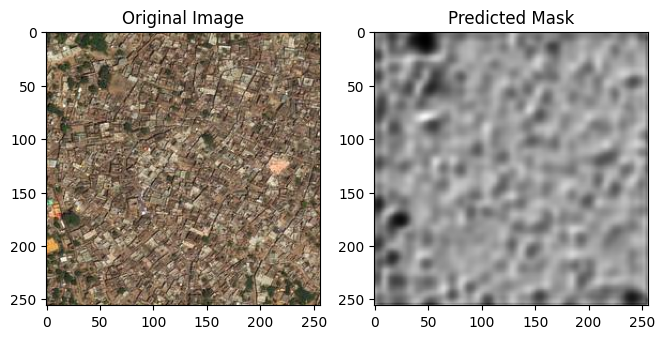

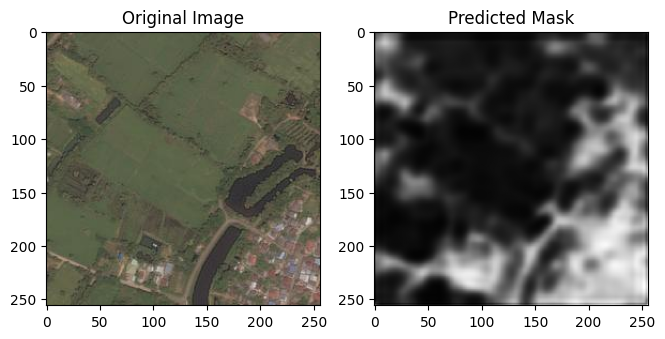

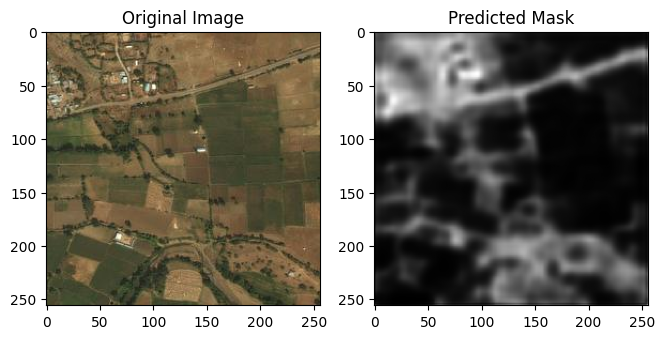

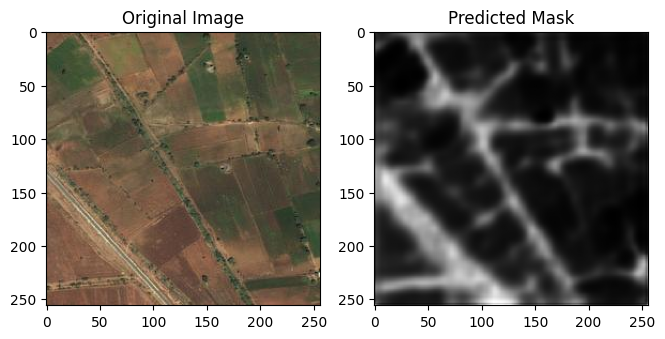

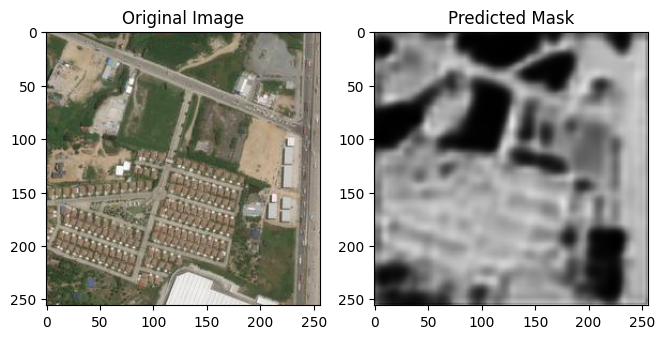

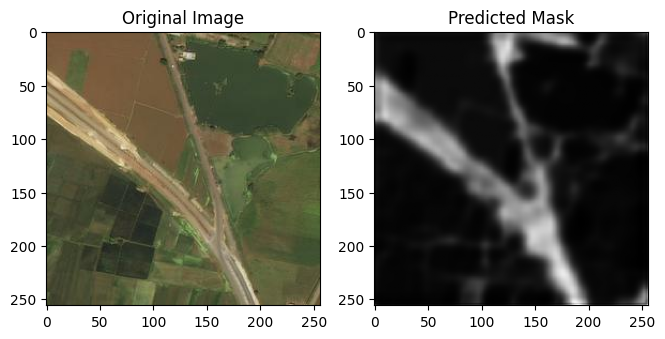

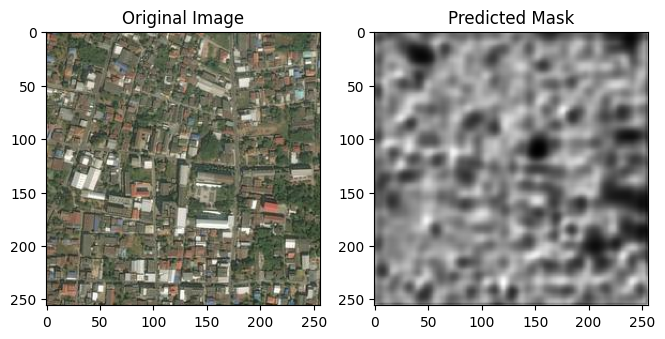

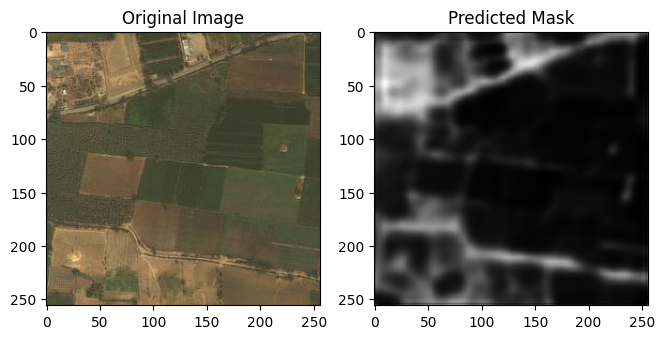

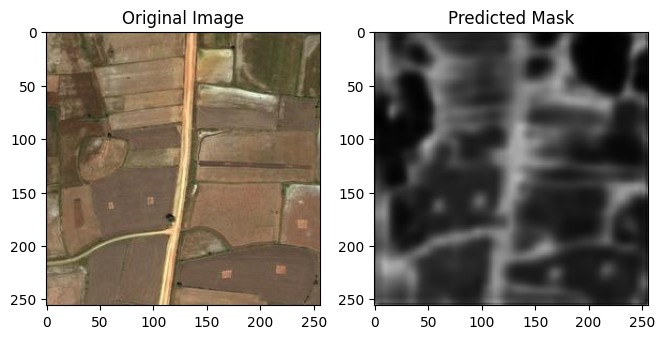

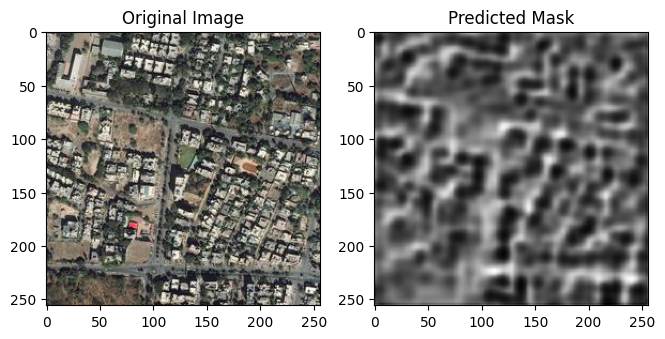

In [ ]:
##### AT 8 epochs #####
import matplotlib.pyplot as plt
import numpy as np

# Visualize some predictions
num_images_to_show = 10  # Adjust as needed

for i in range(num_images_to_show):
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(test_gen[i][0][0])  # Get the first test image
    plt.title('Original Image')

    # Predicted Mask
    plt.subplot(1, 3, 2)
    plt.imshow(predictions[i].squeeze(), cmap='gray')  # Squeeze to remove channels if needed
    plt.title('Predicted Mask')

    plt.show()

In [ ]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/CNN-25(full).keras')

In [ ]:
predictions = model.predict(test_gen)

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step


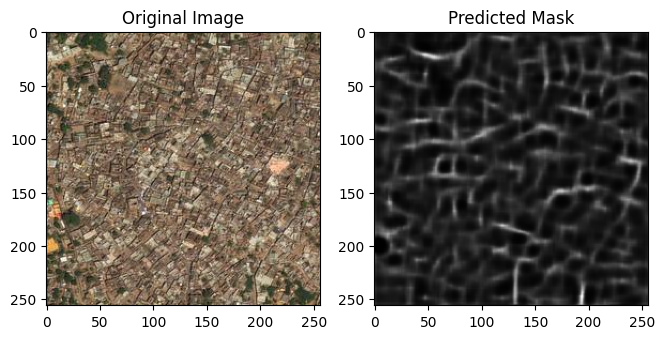

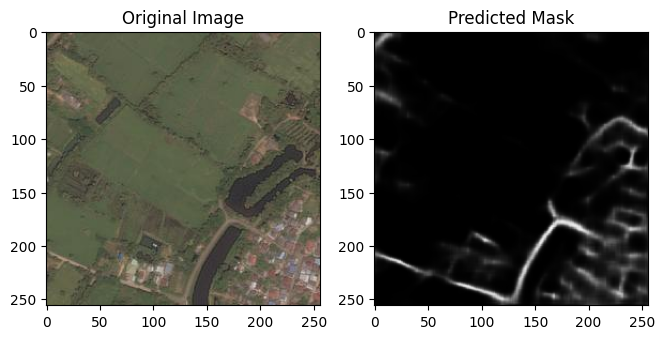

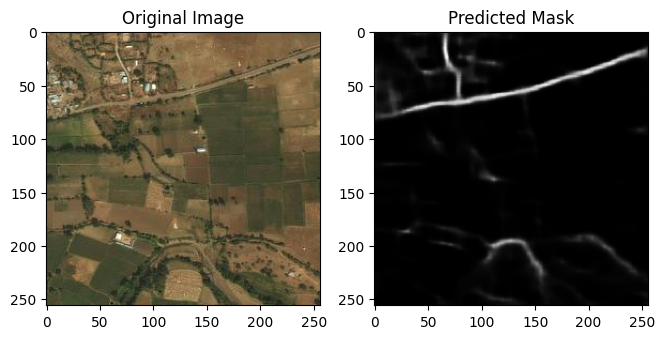

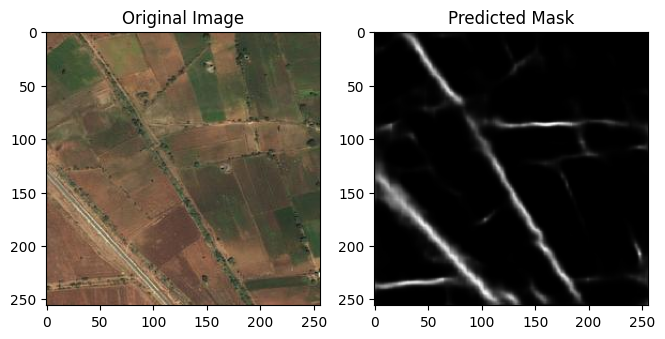

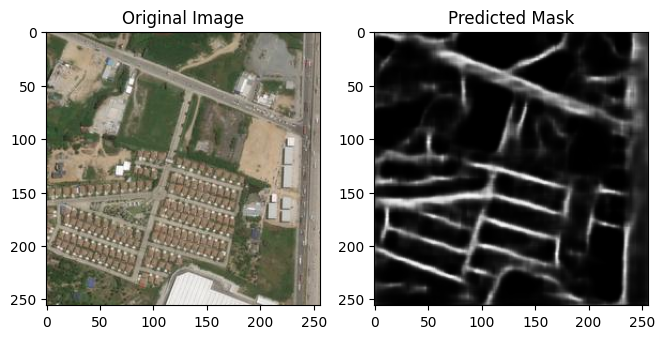

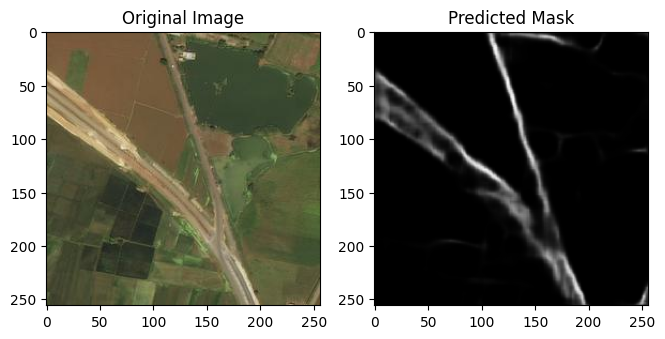

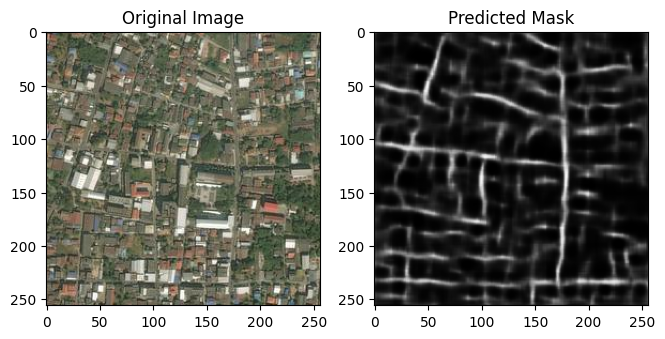

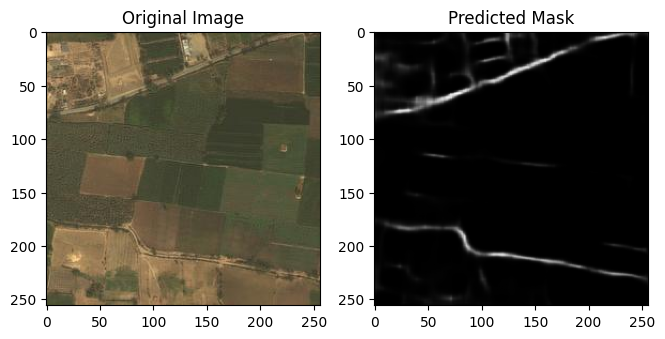

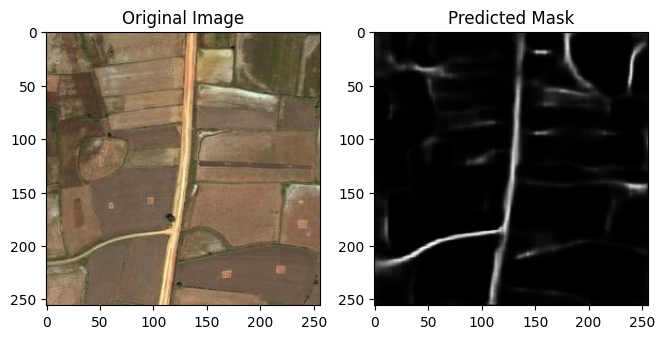

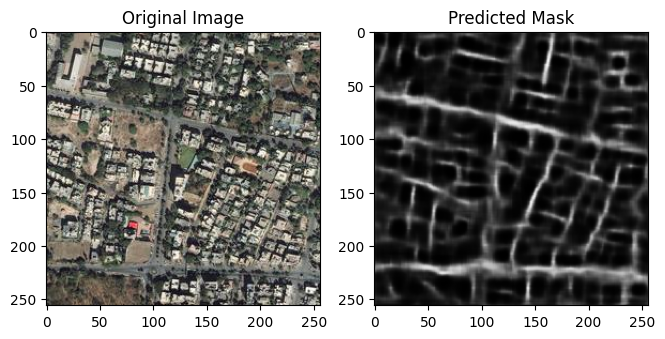

In [ ]:
##### AT 25 epochs #####
import matplotlib.pyplot as plt
import numpy as np

# Visualize some predictions
num_images_to_show = 10  # Adjust as needed

for i in range(num_images_to_show):
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(test_gen[i][0][0])  # Get the first test image
    plt.title('Original Image')

    # Predicted Mask
    plt.subplot(1, 3, 2)
    plt.imshow(predictions[i].squeeze(), cmap='gray')  # Squeeze to remove channels if needed
    plt.title('Predicted Mask')

    plt.show()

In [ ]:
#### Testing on random images ######
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the path to your resized test images
test_images_path = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images'

# Get a list of all image filenames
image_filenames = os.listdir(test_images_path)

# Randomly select a subset of images for testing
num_samples = 5  # Specify the number of images to test
sample_filenames = random.sample(image_filenames, num_samples)

# Load and preprocess images
test_images = []
for filename in sample_filenames:
    image_path = os.path.join(test_images_path, filename)
    image = Image.open(image_path).convert('RGB')
    image = image.resize((256, 256))  # Resize to match model input
    image_array = np.array(image) / 255.0  # Normalize pixel values
    test_images.append(image_array)

test_images = np.array(test_images)


In [ ]:
from tensorflow.keras.models import load_model

# Load your trained U-Net model
model = load_model('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/CNN-25(full).keras', compile=False)

# Predict segmentation masks for the test images
predicted_masks = model.predict(test_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [ ]:
# Threshold the predicted masks to obtain binary masks
binary_masks = (predicted_masks > 0.15).astype(np.uint8)

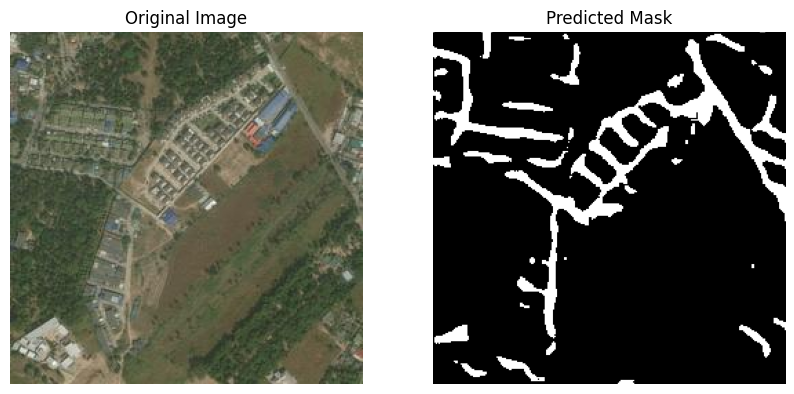

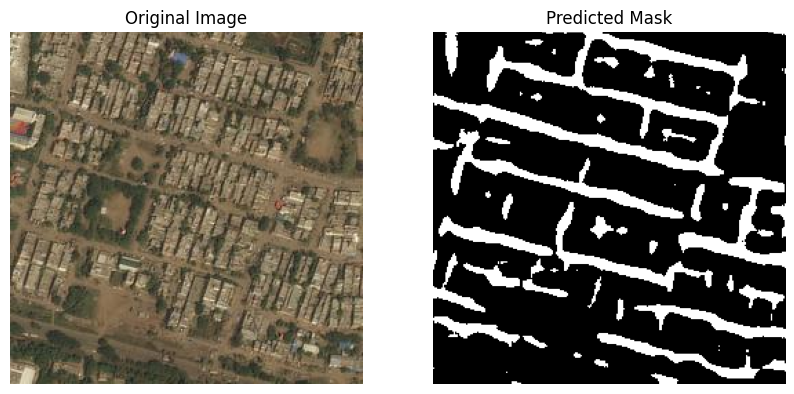

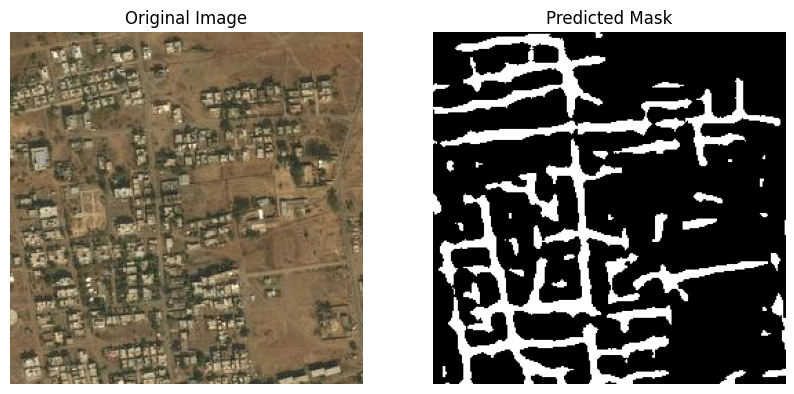

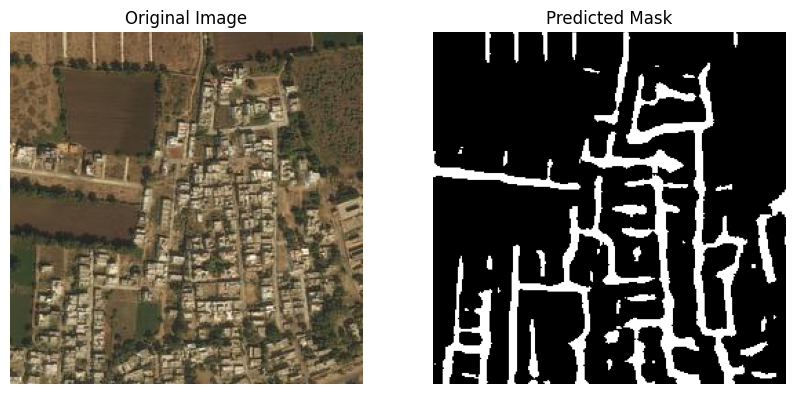

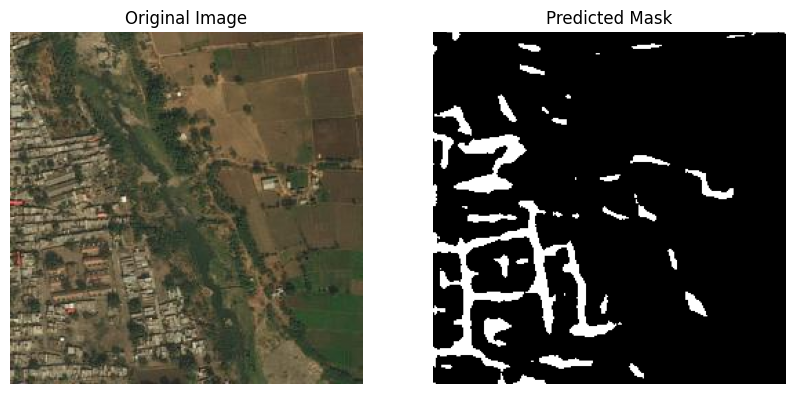

In [ ]:
# Visualize the original images and their corresponding predicted masks
for i in range(num_samples):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(test_images[i])
    plt.title('Original Image')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(1, 2, 2)
    plt.imshow(binary_masks[i].squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


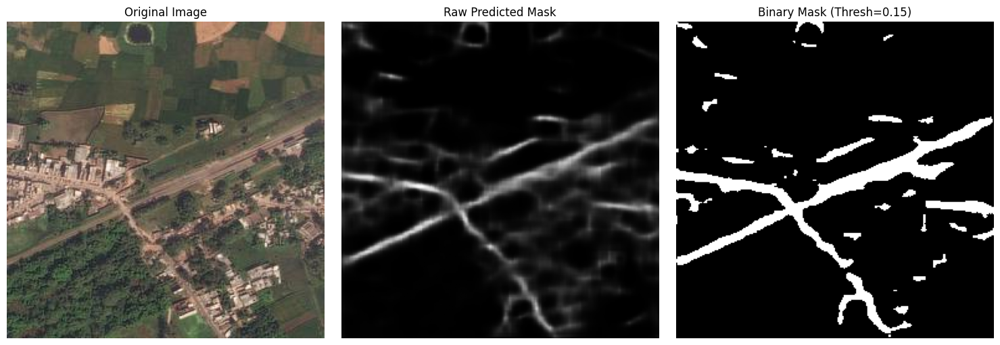

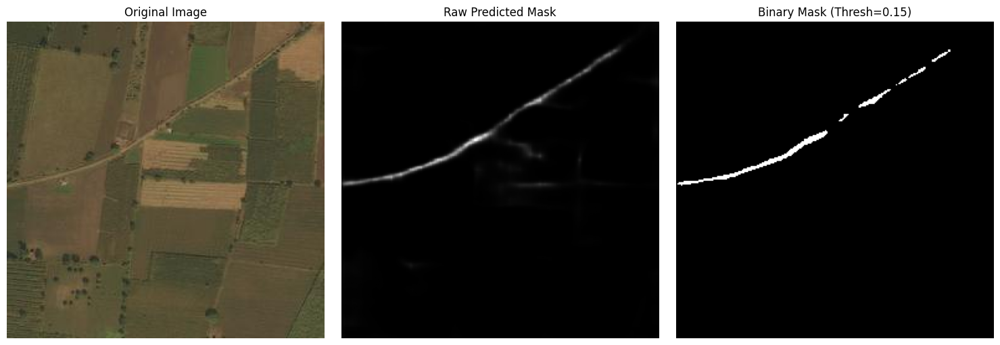

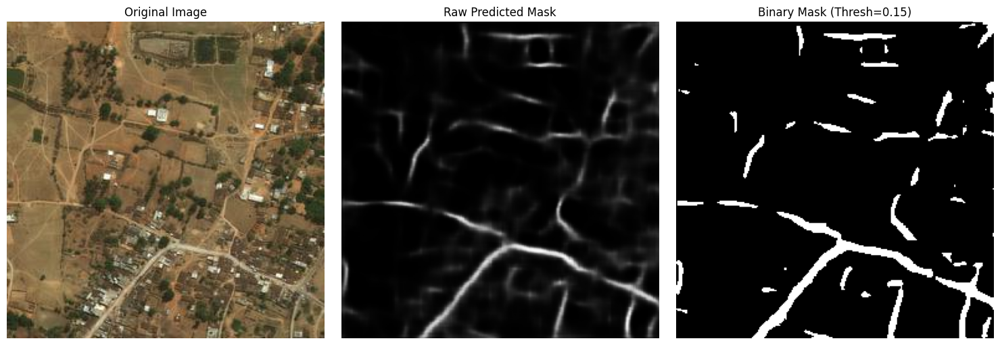

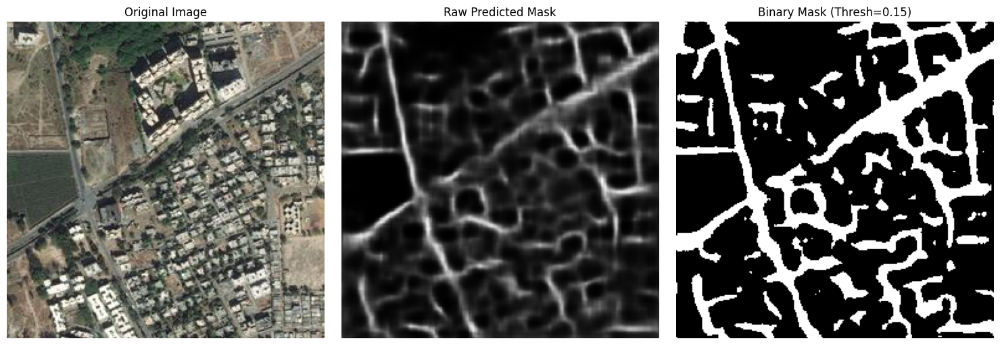

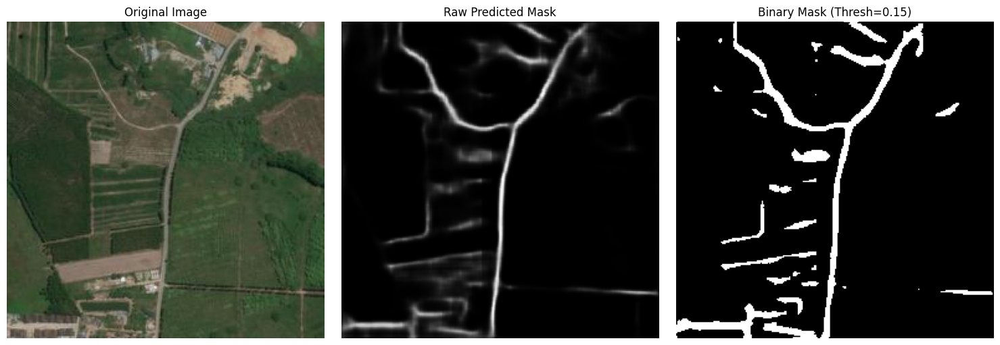

In [ ]:
#### Testing and predicting ####
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# === Settings ===
test_images_path = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images'
num_images_to_show = 5  # Adjust as needed
threshold = 0.15        # Prediction threshold

# === Load and preprocess random test images ===
image_filenames = [f for f in os.listdir(test_images_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
sample_filenames = random.sample(image_filenames, num_images_to_show)

test_images = []
original_images = []

for filename in sample_filenames:
    image_path = os.path.join(test_images_path, filename)
    image = Image.open(image_path).convert('RGB')
    image = image.resize((256, 256))                    # Match model input
    original_images.append(np.array(image))             # Save for later display
    image_array = np.array(image) / 255.0               # Normalize
    test_images.append(image_array)

test_images = np.array(test_images)                     # Shape: (N, 256, 256, 3)

# === Make predictions ===
predicted_masks = model.predict(test_images)
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# === Visualize predictions ===
for i in range(num_images_to_show):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    # Raw Predicted Mask (heatmap)
    plt.subplot(1, 3, 2)
    plt.imshow(predicted_masks[i].squeeze(), cmap='gray')
    plt.title('Raw Predicted Mask')
    plt.axis('off')

    # Thresholded Binary Mask
    plt.subplot(1, 3, 3)
    plt.imshow(binary_masks[i].squeeze(), cmap='gray')
    plt.title(f'Binary Mask (Thresh={threshold})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
